# **Proyecto 3: Cut-it**


_Jessenia Piza & Paula Lorena López_

El objetivo del siguiente proyecto es desarrollar un algortimo de segmentación de imágenes a color por medio de _Mean Shift_ y partición de grafos.

Principalmente, el algortimo analizará los pixeles y encontrará los espacios en donde se obtenga una densidad máxima.

Importamos las librerías que utilizaremos para el desarrollo de este.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import pairwise_distances
from scipy.stats import gmean
from skimage.segmentation import slic, mark_boundaries
from sklearn.metrics.pairwise import euclidean_distances, rbf_kernel
from scipy.stats.mstats import gmean
from sklearn.cluster import SpectralClustering
import seaborn as sns
from matplotlib.lines import Line2D

Creamos una función que nos mostrará las imágenes tanto la original como la filtrada.

In [2]:
def plot_images(img, img2, names = ['Imagen Original', 'Imagen Filtrada'], cmap = None):
    fig, ax = plt.subplots(1,2, figsize=(20,20))
    ax[0].imshow(img, cmap = cmap)
    ax[0].set_title(names[0])
    ax[1].imshow(img2, cmap = cmap)
    ax[1].set_title(names[1])

## Implementación del algortimo

Para la implementación del algortimo, se escogió trabajar por medio de superpixeles dado que disminuye la complejidad computacional y el espacio de memoria. 
Un superpixel es un grupo de pixeles conectados que contienen características similares entre ellos.


Creamos una función que hallará la media geométrica con el fin de hallar el centroide de cada super pixel para la realización del algoritmo.

In [3]:
def geo_mean(matrix, idx):
    mtx = matrix[matrix[:,idx] != 0][:,idx]
    if mtx.size != 0:
        return gmean(mtx)    
    else:
        return 0

Creamos una función que recibe la imagen y la cantidad de segmentos en las que se que quiere particionar la imagen para construir los superpixeles.

In [4]:
def superpixels_segmentation(im, n_segments):
    pixels = im.reshape((im.shape[0]*im.shape[1],3))
    label_slic = slic(im, n_segments = n_segments, start_label=0)
    img_slic = mark_boundaries(im, label_slic) 
    labels_slic = label_slic.reshape(im.shape[0]*im.shape[1])
    segments = []
    for q in np.unique(labels_slic):
        segments.append(np.random.choice(np.where(labels_slic == q)[0]))
    superpixels = pixels[segments]
    return img_slic, superpixels, pixels, labels_slic

Se implemeta el algortimo de _Mean shift_. Se ingresa la imagen y el radio. 
Por medio del radio, se definirá un entorno y así se hallará los centroides, definidos por la media geométrica, que están contenidos en este. Para cada superpixel, se tendrán los valores para los cuales covergen y así se agruparán para lograr hacer la segmentación. 

In [5]:
def mean_shift(im, r, n_segments = 1000):
    _, superpixels, pixels, labels_slic = superpixels_segmentation(im, n_segments)

    centers, superpixels_centers, points = [], [], []
    for q in range(superpixels.shape[0]):
        distances = euclidean_distances(pixels, [superpixels[q]])
        idx = np.where(distances<=r)[0]
        new_matrix = pixels[idx]
        ant_center = superpixels[q]
        new_center = np.array([geo_mean(new_matrix, 0), 
                               geo_mean(new_matrix, 1), 
                               geo_mean(new_matrix, 2)])
        while np.linalg.norm(ant_center - new_center) > 1:
            ant_center = new_center
            distances2 = euclidean_distances(pixels, [ant_center])
            idx = np.where(distances2<=r)[0]
            new_matrix = pixels[idx]
            new_center = np.array([geo_mean(new_matrix, 0), 
                                   geo_mean(new_matrix, 1), 
                                   geo_mean(new_matrix, 2)])
        if new_center.tolist() in centers:
            idx2 = centers.index(new_center.tolist())
            for i in idx.tolist():
                if i not in points[idx2]:
                    points[idx2].append(i)
        else:
            centers.append(new_center.tolist())
            points.append(idx.tolist())
        superpixels_centers.append(new_center.tolist())

    centers_pixels = np.zeros(pixels.shape)
    for q in range(len(points)):
        centers_pixels[points[q]] = centers[q]
    centers_pixels /= np.max(centers_pixels)
    return centers_pixels, len(centers)

Se tendrán en cuentas las diferentes representaciones en espacio de color para trabajar en las diferentes imágenes.

In [6]:
def plot_types_image(im_rgb, im_luv, im_hsv):
    names = ['Imagen RGB', 'Imagen LUV', 'Imagen HSV']
    fig, ax = plt.subplots(1,3, figsize=(20,20))
    ax[0].imshow(im_rgb)
    ax[0].set_title(names[0])
    ax[1].imshow(im_luv)
    ax[1].set_title(names[1])
    ax[2].imshow(im_hsv)
    ax[2].set_title(names[2])

In [7]:
im = cv2.imread('imagen.PNG')
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im_luv = cv2.cvtColor(im, cv2.COLOR_BGR2Luv)
im_hsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)

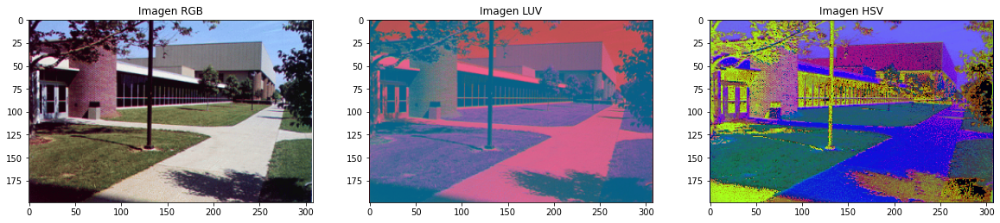

In [8]:
plot_types_image(im_rgb, im_luv, im_hsv)

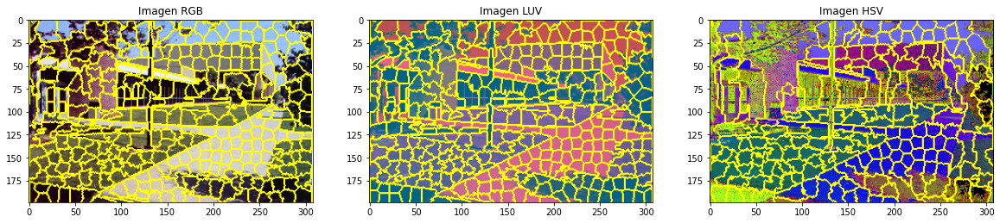

In [9]:
n_segments = 500
slic_rgb, _, _, _ = superpixels_segmentation(im_rgb, n_segments)
slic_luv, _, _, _ = superpixels_segmentation(im_luv, n_segments)
slic_hsv, _, _, _ = superpixels_segmentation(im_hsv, n_segments)
plot_types_image(slic_rgb, slic_luv, slic_hsv)

Note que teniendo en cuenta los diferentes espacios de color, al segemntar la imagen para particionar los superpixeles, la imagen _LUV_ tiene una mejor particion adecuada.
Por esta razón el algortimos _Mean shift_ se hará teniendo en cuenta esta escala de color.

In [10]:
def image_mean_shift(im, r, image_type, n_segments = 1000):
    if image_type == 'RGB':
        im_luv = cv2.cvtColor(im, cv2.COLOR_RGB2Luv)
    elif image_type == 'BGR':
        im_luv = cv2.cvtColor(im, cv2.COLOR_BGR2Luv)
    elif image_type == 'HSV':
        im_luv = cv2.cvtColor(im, cv2.COLOR_HSV2RGB)  
        im_luv = cv2.cvtColor(im_luv, cv2.COLOR_RGB2Luv)
    else:
        im_luv = im
    centers_pixels = mean_shift(im_luv, r, n_segments)
    image = centers_pixels[0].reshape((im_luv.shape[0], im_luv.shape[1], 3))
    image = np.array(image*255, dtype='uint8')
    im_rgb = cv2.cvtColor(image, cv2.COLOR_LUV2RGB)
    return im_rgb, centers_pixels

Ahora bien, se logra evidenciar la imagen original en _RGB_ y la imagen segmentada. Si bien es cierto que hay varias regiones negras esto se da porque en la imagen original existen varias regiones oscuras. Así pues, podemos notar que no varía mucho el resultado que se muestra una imagen bien definida.

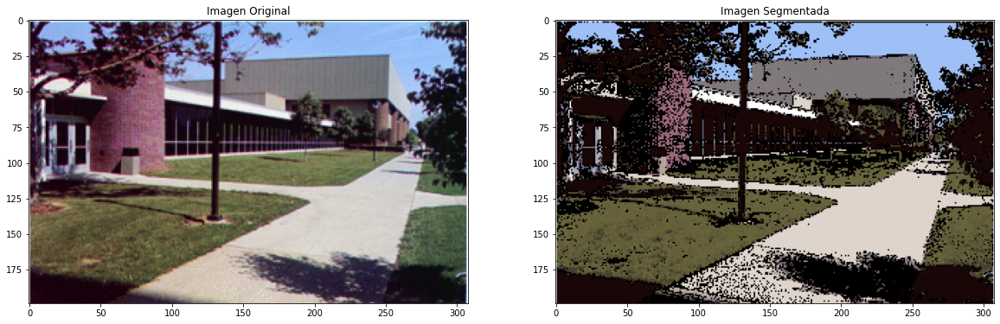

In [11]:
r = 15
n_segments = 500
image_rgb = image_mean_shift(im_rgb, r, 'RGB', n_segments)
plot_images(im_rgb, image_rgb[0], names = ['Imagen Original', 'Imagen Segmentada'])

In [12]:
im_new = np.reshape(im, [-1,3])
im_new.shape
x = im_new[:,0]
y = im_new[:,1]
z = im_new[:,2]

Además se logra ver el comportamiento de los clusters por colores de la imagen.

In [13]:
centers_rgb = image_rgb[1]

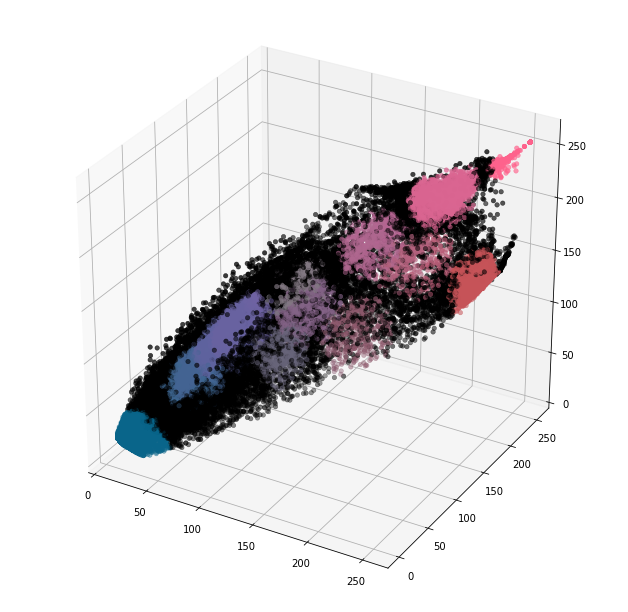

In [14]:
fig = plt.figure(figsize=(11,11))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=np.array(centers_rgb[0]), cmap='viridis', linewidth=0.5);

### Imagen LUV

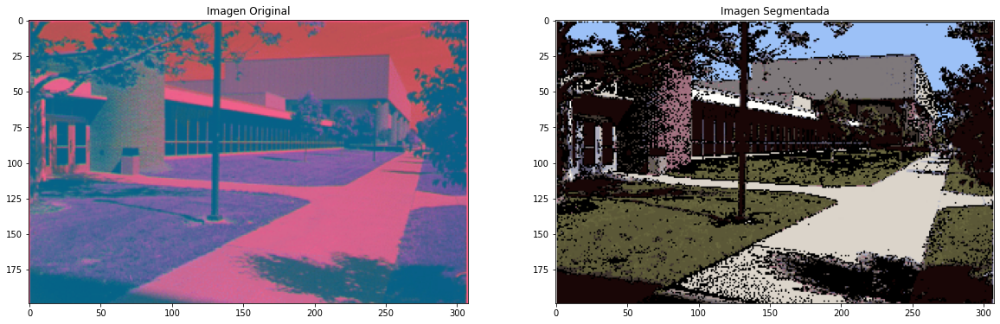

In [15]:
image_luv = image_mean_shift(im_luv, r, 'LUV', n_segments)
plot_images(im_luv, image_luv[0], names = ['Imagen Original', 'Imagen Segmentada'])

In [16]:
centers_luv = image_luv[1]

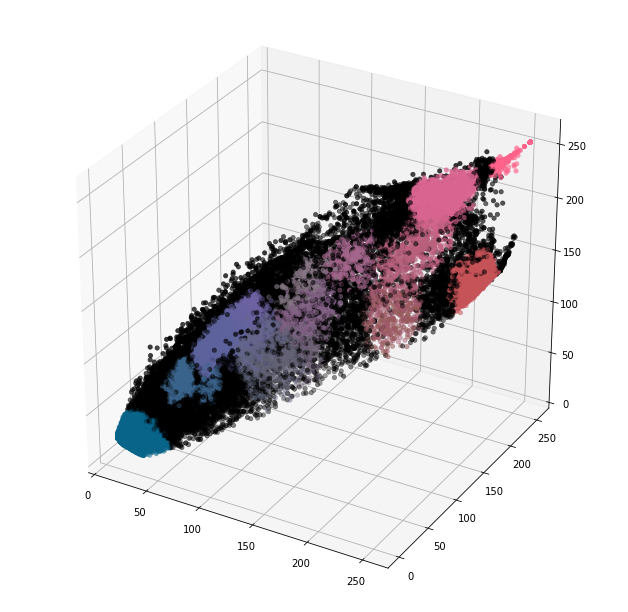

In [17]:
fig = plt.figure(figsize=(11,11))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=np.array(centers_luv[0]), cmap='viridis', linewidth=0.5);

### Imagen HSV

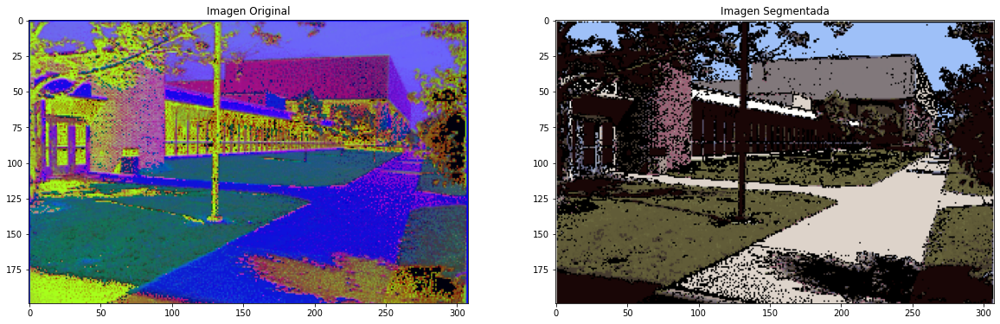

In [18]:
image_hsv = image_mean_shift(im_hsv, r, 'HSV', n_segments)
plot_images(im_hsv, image_hsv[0], names = ['Imagen Original', 'Imagen Segmentada'])

In [19]:
centers_hsv = image_hsv[1]

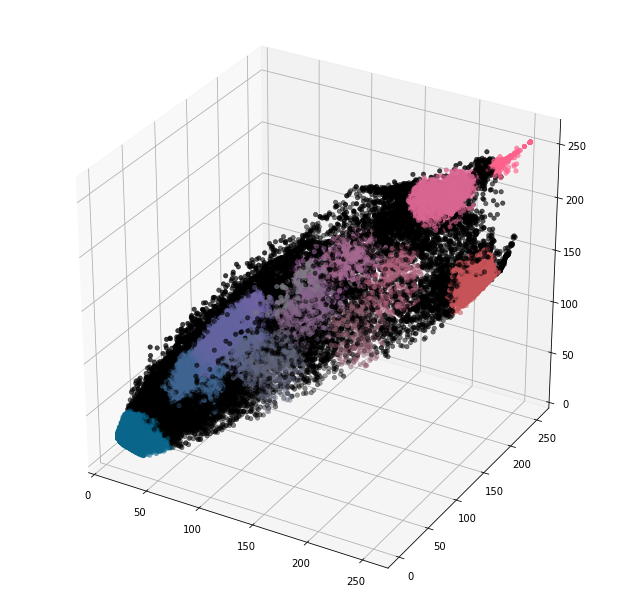

In [20]:
fig = plt.figure(figsize=(11,11))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=np.array(centers_hsv[0]), cmap='viridis', linewidth=0.5);

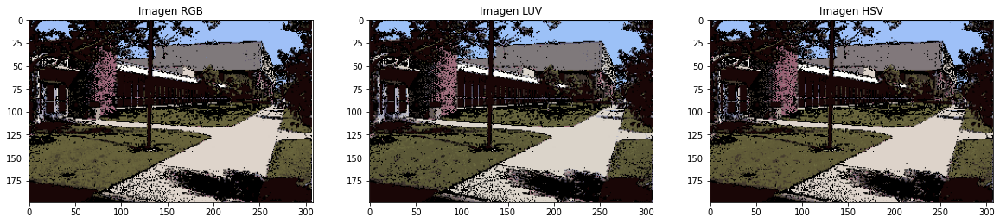

In [21]:
plot_types_image(image_rgb[0], image_luv[0], image_hsv[0])

In [54]:
num_center = image_rgb[1][1]
num_center

73

Finalmente, podemos evidenciar que al segmentar las imágenes en diferentes escalas de color, en _HSV_ tiene menos cantidad de regiones negras y se segmenta mejor por color. Sin embargo, entre la imagen en _LUV_ y _RGB_, la primera tiene mejor claridad en alguna regiones como la parte de la pared roja de la imagen mientras que, en la segunda, el césped tiene mejor claridad.
También note que el número de centros es de 73. Esto quiere decir que se segmentó la imagen en 73 pedazos.
Aún para ser una imagen tan grande y tantos colores fuertes, sigue siendo un buen el resultado.
Al final, depende de la imagen y los colores que tan claro se pueda segmentar.

Haremos el ejemplo con otra imagen.

In [35]:
im1 = cv2.imread('conejo.jpg')
im_rgb1 = cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)
im_luv1 = cv2.cvtColor(im1, cv2.COLOR_BGR2Luv)
im_hsv1 = cv2.cvtColor(im1, cv2.COLOR_BGR2HSV)

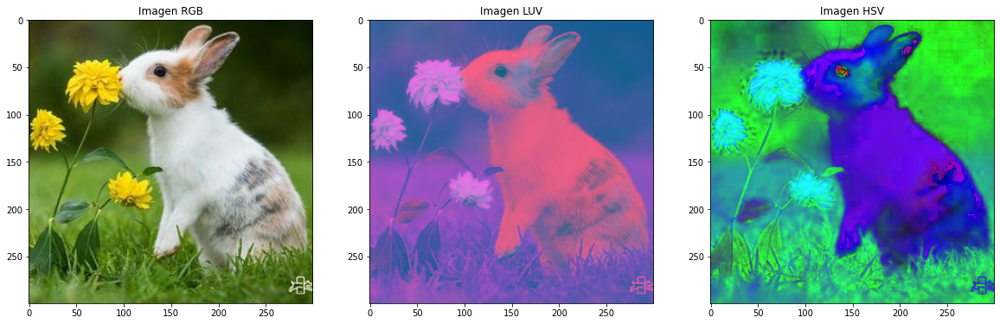

In [36]:
plot_types_image(im_rgb1, im_luv1, im_hsv1)

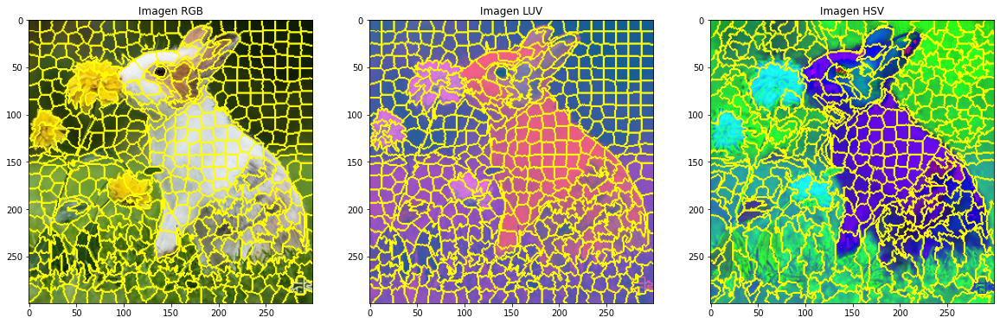

In [37]:
n_segments1 = 500
slic_rgb1, _, _, _ = superpixels_segmentation(im_rgb1, n_segments1)
slic_luv1, _, _, _ = superpixels_segmentation(im_luv1, n_segments1)
slic_hsv1, _, _, _ = superpixels_segmentation(im_hsv1, n_segments1)
plot_types_image(slic_rgb1, slic_luv1, slic_hsv1)

## Imagen RGB

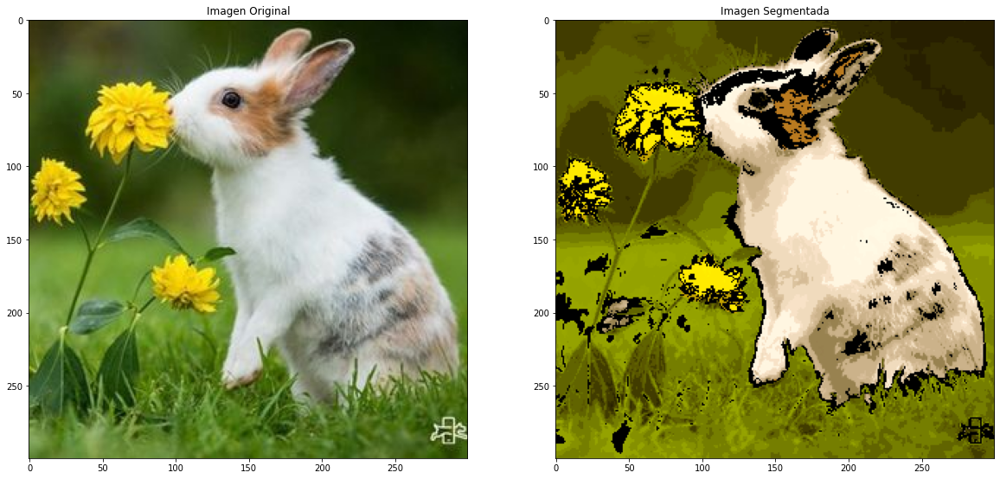

In [39]:
r = 15
n_segments = 350
image_rgb1 = image_mean_shift(im_rgb1, r, 'RGB', n_segments1)
plot_images(im_rgb1, image_rgb1[0], names = ['Imagen Original', 'Imagen Segmentada'])

In [41]:
im_new1 = np.reshape(im1, [-1,3])
im_new1.shape
x = im_new1[:,0]
y = im_new1[:,1]
z = im_new1[:,2]

In [42]:
centers_rgb1 = image_rgb1[1]

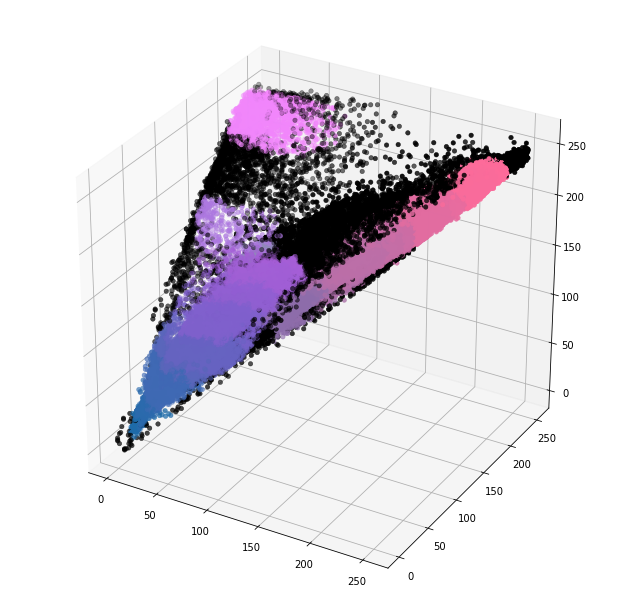

In [43]:
fig = plt.figure(figsize=(11,11))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=np.array(centers_rgb1[0]), cmap='viridis', linewidth=0.5);

## Imagen LUV

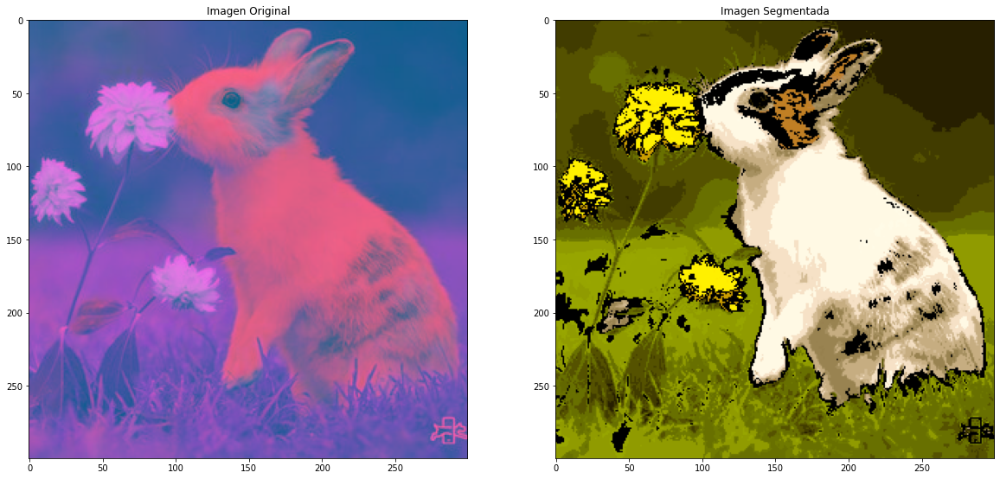

In [44]:
image_luv1 = image_mean_shift(im_luv1, r, 'LUV', n_segments1)
plot_images(im_luv1, image_luv1[0], names = ['Imagen Original', 'Imagen Segmentada'])

In [47]:
centers_luv1 = image_luv1[1]

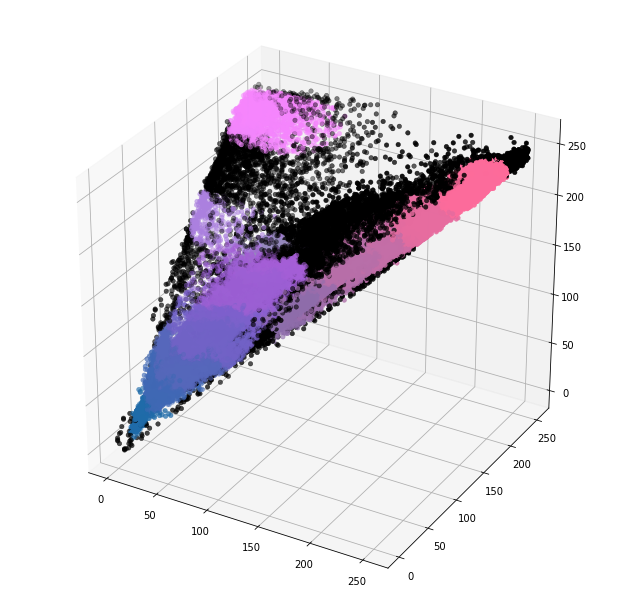

In [48]:
fig = plt.figure(figsize=(11,11))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=np.array(centers_luv1[0]), cmap='viridis', linewidth=0.5);

## Imagen HSV

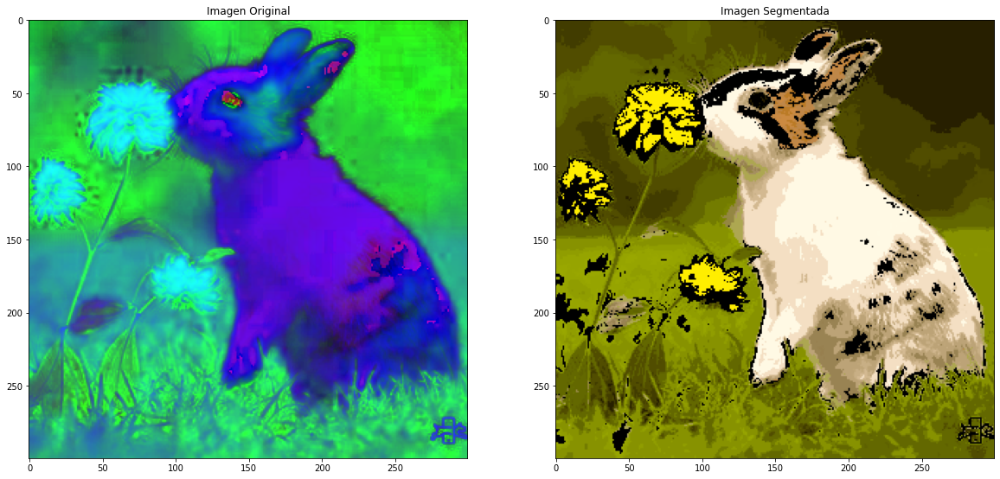

In [49]:
image_hsv1 = image_mean_shift(im_hsv1, r, 'HSV', n_segments1)
plot_images(im_hsv1, image_hsv1[0], names = ['Imagen Original', 'Imagen Segmentada'])

In [50]:
centers_hsv1 = image_hsv1[1]

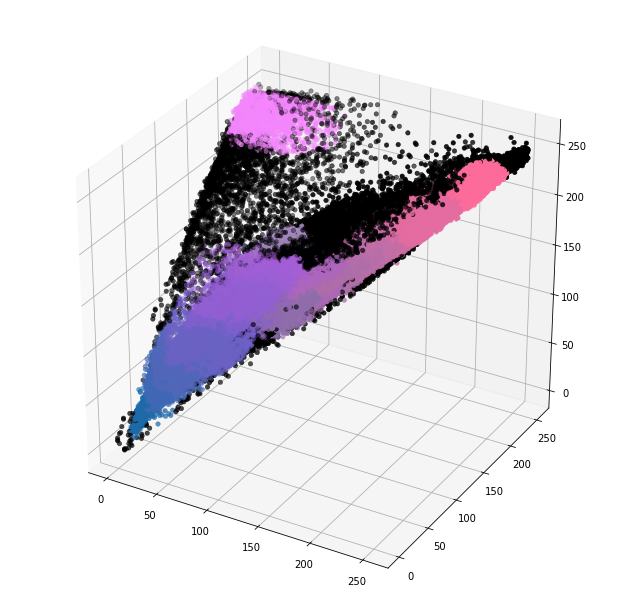

In [51]:
fig = plt.figure(figsize=(11,11))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=np.array(centers_hsv1[0]), cmap='viridis', linewidth=0.5);

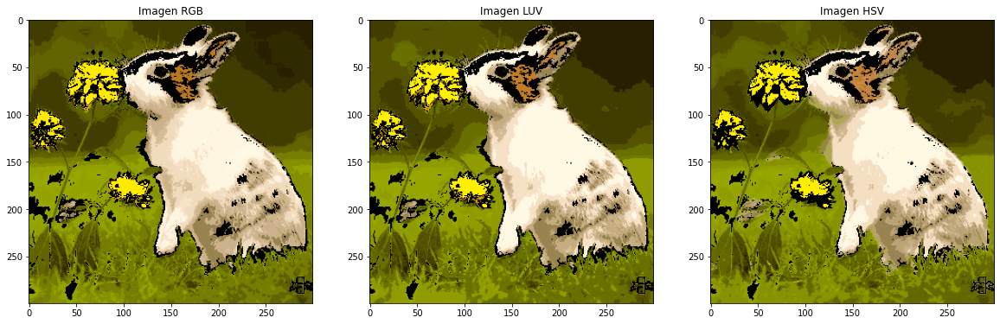

In [52]:
plot_types_image(image_rgb1[0], image_luv1[0], image_hsv1[0])

Podemos evidenciar que una vez más las imágenes en color _LUV_ y _HSV_ resultan con mejor segmentación que _RGB_. Aunque en las tres se tiene una imagen clara del conejo, en la primera se ven mas regiones de color negro.
Sin embargo, se evidencia más que todo en lugares como bordes. 
Aún así, los colores concuerdan con los colores de la imagen orginal.


In [56]:
num_center = image_rgb1[1][1]
num_center

210

El número de centros de la imagen es de 210.

# Algoritmo basado en grafos

Este algortimo se basa en el clustering espectral.
De esta manera, se  construye el grafo de la imagen por medio de los centros anteriormente hallados. 

En el proceso se tiene en cuenta la matriz laplaciana y el algortimo de clustering. 
El algortimo utilizado para esta ocasión fue _SpectralClustering_ de la librería de _Sklearn_. 

Se define una función _spectrum_ la cual realizará la normalización de la matriz laplaciana. Así mismo, retorna los autovalores y autovectores con los que se realizará el algortimo de segmentación.

Cabe recordar que el valor de $\gamma$ es importante pues dado este valor se puede obtener valores complejos.

In [28]:
def spectrum(img, gamma):
  W = rbf_kernel(img, gamma=gamma)
  D = np.diag(np.sum(W, axis=0))
  L_sym = np.eye(D.shape[0]) - np.sqrt(np.linalg.inv(D))@W@np.sqrt(np.linalg.inv(D))
  eigen_values, eigen_vectors = np.linalg.eig(L_sym)
  return eigen_values, eigen_vectors


Una vez encontrados los autovectores, se realiza clustering con el fin de obtener los grupos de colores con los cuales se obtendrá la nueva imagen segmentada. 

In [29]:
def spectral_Segmentation(im, gamma, k):
  im_luv = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  segments = slic(im_luv, n_segments=100, start_label=0)
  segments_ids = np.unique(segments)
  centers = np.array([np.mean(np.nonzero(segments==i), axis=1) for i in segments_ids])
  centers = np.array(centers, dtype='int')

  img = im_luv[centers[:,0], centers[:,1]]
  img = np.hstack((img, centers))
  eigen_values, eigen_vectors = spectrum(img, gamma)
  idx = eigen_values.argsort()
  U = eigen_vectors[idx]
  U_k = U[:, :k]

  T = np.zeros(U_k.shape)
  for i in range(T.shape[0]):
      for j in range(T.shape[1]):
          T[i,j] = U[i,j]/np.sqrt(np.sum(U[i,:]**2))

  clustering = SpectralClustering(n_clusters=k)
  df = pd.DataFrame(T)
  clustering.fit(df)
  labels = clustering.labels_

  colors = np.zeros((np.max(labels)+1, 5))
  for q in np.unique(labels):
      colors[q] = np.mean(img[np.where(labels == q)[0]], axis = 0)

  segments_resized = segments.reshape(segments.shape[0]*segments.shape[1])
  segments_labels = np.zeros(segments_resized.shape)
  for q in range(len(labels)):
      idx = np.where(segments_resized == q)[0]
      segments_labels[idx] = labels[q]

  colors_matrix = np.zeros((segments_labels.shape[0], 5))
  for q in np.unique(labels):
      idx = np.where(segments_labels == q)[0]
      colors_matrix[idx, :] = colors[q]

  colors_matrix = colors_matrix.reshape(im_luv.shape[0], im_luv.shape[1],5)
  colors_matrix = colors_matrix[:,:,:3]
  colors_matrix /= 255
  return colors_matrix, segments, df

La función retorna el grafo asociado a la imagen.

In [30]:
def plot_graph(segments, im_luv):
  segments_ids = np.unique(segments)
  centers = np.array([np.mean(np.nonzero(segments==i), axis=1) for i in segments_ids])
  vs_right = np.vstack([segments[:,:-1].ravel(), segments[:,1:].ravel()])
  vs_below = np.vstack([segments[:-1,:].ravel(), segments[1:,:].ravel()])
  bneighbors = np.unique(np.hstack([vs_right, vs_below]), axis=1)

  fig, ax = plt.subplots(1,1, figsize=(11,11))
  ax.imshow(mark_boundaries(im_luv, segments, color=(1,1,1)))
  ax.scatter(centers[:,1],centers[:,0], c='y')

  for i in range(bneighbors.shape[1]):
      y0,x0 = centers[bneighbors[0,i]]
      y1,x1 = centers[bneighbors[1,i]]

      l = Line2D([x0,x1],[y0,y1], alpha=1)
      ax.add_line(l)

In [31]:
im = cv2.imread('arbol.jpeg')
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

In [32]:
gamma = 0.2
n_clusters = 60
colors_matrix, segments, diag = spectral_Segmentation(im, gamma, n_clusters)

Entonces bien, el grafo relacionado a la imagen es el siguiente. Como se puede ver, el centro de cada región se trata como nodo del grafo.

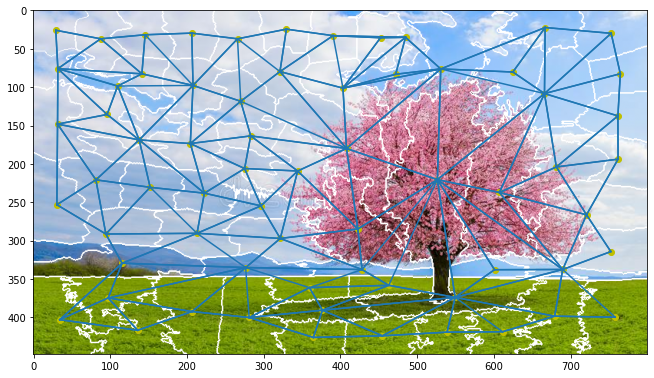

In [33]:
plot_graph(segments, im_rgb)

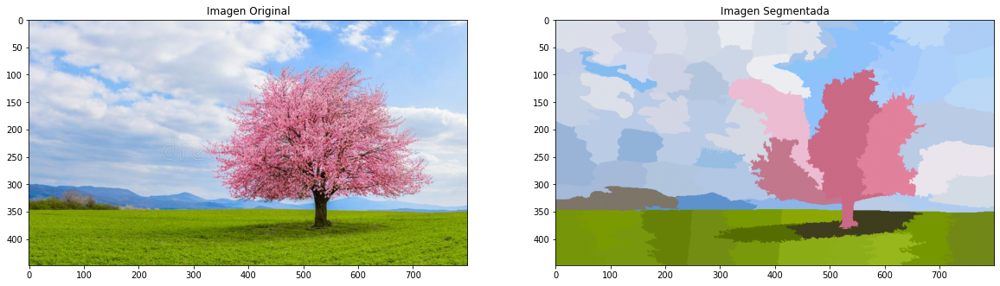

In [34]:
plot_images(im_rgb, colors_matrix, names = ['Imagen Original', 'Imagen Segmentada'])

Podemos ver que la imagen segmentada no está muy definida pero los colores corresponden a los colores de la imagen original. 
La ubicación de los colores dependen de la partición dada por el grafo. Por esta razón, parte del arbol, en este caso, tiene el color del cielo y parte del cielo  también tiene el color del árbol.
Sin embargo es una buena segmentación dado que se identifica la imagen original.

Ahora bien, hay que tener en cuenta en la cantidad de segmentos en la que se particionará la imagen.
Si vemos en el grafo, hay nodos que terminan compartiendo muchas regiones y esto puede hacer que el resultado varíe.
Además hay que varías el valor de $\gamma$ (gamma).

De esta manera, estos dos valores definen el umbral de la segmentación.


Finalmente, podemos concluir que cada escala de color tiene un segmentación diferente para cada imagen dependiendo de la intesnidad de los colores. Sin embargo, segmentar a partir de la imagen en _LUV_ es la mejor opción para obtener una imagen más definida y clara. 

Por otro lado, se puede conseguir una mejora si el valor de $\gamma$ se pudiera definir predeterminadamente pues así no se tendría que variar tanto dependiendo de la imagen. 

El algortimo de _Mean shift_ aunque funciona, tiene cierto margen de error con las zonas oscuras pues tienden a cero. Esto hace que la imagen se vea con zonas negras en la segmentación, así que probando con más valores se podría conseguir un valor en el cual la segmentación sea casi perfecta. Además, si la imagen no es lo suficientemente pequeña, la optimización del algortimo definitivamente no es la mejor. 


### **Jessenia Piza & Paula Lorena López**